In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from astropy.stats.circstats import circmean
from functools import reduce
import datetime
import pickle
import time
import plotly.express as px
import numpy as np
import sqlite3

pd.set_option("display.precision", 2)
plt.rcParams.update({'font.size': 20, 'figure.figsize': (8, 4)})

%matplotlib inline
import matplotlib_inline
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')

import seaborn as sns
sns.set()

import warnings
warnings.filterwarnings('ignore')

In [2]:
NIGHT_STUDENT_CODE = 105
MORNING_STUDENT_CODE = 228

connector = sqlite3.connect("../../Extras/graphs_data.db")
cursorMorning = connector.cursor()
cursorNight = connector.cursor()

### implementing functions to help with graphs printing

In [3]:
def print_single_values_graph(Samples):
    #getting heartrate samples from dataframe
    heartrate_samples_dict = pickle.loads(Samples[3])
    heartrate_dict_keys = list(heartrate_samples_dict.keys())
    heartrate_dict_values = list(heartrate_samples_dict.values())
    heartrate_samples_df = pd.DataFrame({'time':heartrate_dict_keys, 'heartrate':heartrate_dict_values})
    #preparing plot title name
    plot_title_name = 'user ID: '+str(Samples[0])+' Date: '+str(Samples[1])+' Type: '+str(Samples[2])
    #creating lineplot
    sns.lineplot(x='time', y='heartrate', data=heartrate_samples_df, color='red')
    plt.title(plot_title_name)
    # configurating axis "x" bins
    plt.xticks(np.arange(0, 25, step=1))
    
    plt.show()

def print_double_values_graph(morning_samples, night_samples):
    #getting heartrate samples from dataframe
    heartrate_morning_samples_dict = pickle.loads(morning_samples[3])
    heartrate_night_samples_dict = pickle.loads(night_samples[3])
    #getting time for axis "x"
    heartrate_morning_dict_keys = list(heartrate_morning_samples_dict.keys())
    heartrate_night_dict_keys = list(heartrate_night_samples_dict.keys())
    #getting heartrate values for axis "y"
    heartrate_morning_dict_values = list(heartrate_morning_samples_dict.values())
    heartrate_night_dict_values = list(heartrate_night_samples_dict.values())
    #building dataframes
    heartrate_morning_samples_df = pd.DataFrame({'time':heartrate_morning_dict_keys, 'heartrate':heartrate_morning_dict_values})
    heartrate_night_samples_df = pd.DataFrame({'time':heartrate_night_dict_keys, 'heartrate':heartrate_night_dict_values})
    #plot title name
    plot_title_name = "Users: ("+str(morning_samples[0])+" vs "+str(night_samples[0])+") Date:"+str(night_samples[1])+" Type: "+night_samples[2]
    
    #creating lineplot
    sns.lineplot(x='time', y='heartrate', data=heartrate_morning_samples_df, color='red')
    sns.lineplot(x='time', y='heartrate', data=heartrate_night_samples_df, color='blue')

    plt.title(plot_title_name)
    
    plt.legend(loc='best', labels=[str(MORNING_STUDENT_CODE)+" (Morning-type)", str(NIGHT_STUDENT_CODE)+" (Night-type)"])
    # configurating axis "x" bins
    plt.xticks(np.arange(0, 25, step=1))
        
    plt.show()

### graphs printing function in given dates

In [4]:
from datetime import datetime, timedelta

def print_compare_graphs_in_dates(start_date, end_date):
    current_date = start_date
    while current_date <= end_date:
        formatted_date = current_date.strftime('%Y-%m-%d')
        cursorMorning.execute("SELECT * FROM heartrate_graphs_data WHERE id="+str(MORNING_STUDENT_CODE)+" and date='"+formatted_date+"'")
        cursorNight.execute("SELECT * FROM heartrate_graphs_data WHERE id="+str(NIGHT_STUDENT_CODE)+" and date='"+formatted_date+"'")
        morningSamples = cursorMorning.fetchone()
        nightSamples = cursorNight.fetchone()
        if((morningSamples is None) and (nightSamples is None)):
            #both students doesnt have samples in that day, nothing to print
            pass
        elif(morningSamples is None):
            #we have night type student samples at this date, we print them
            print_single_values_graph(nightSamples)
        elif(nightSamples is None):
            print_single_values_graph(morningSamples)
        else:
            #both students has samples, we print a compare graph at this date
            print_double_values_graph(morningSamples, nightSamples)

        current_date += timedelta(days=1)

### setting dates and calling printing function to print graphs

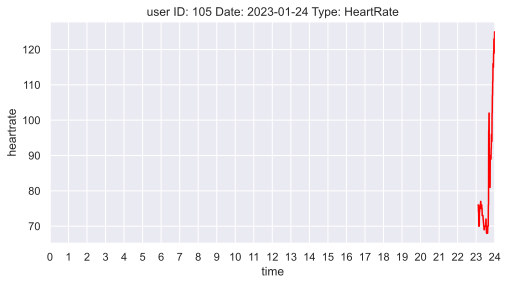

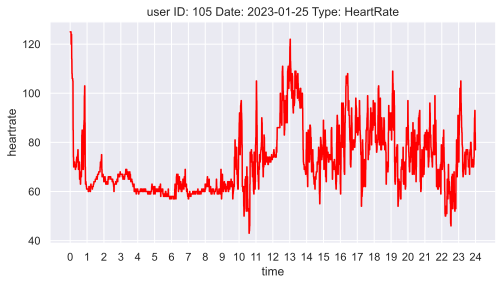

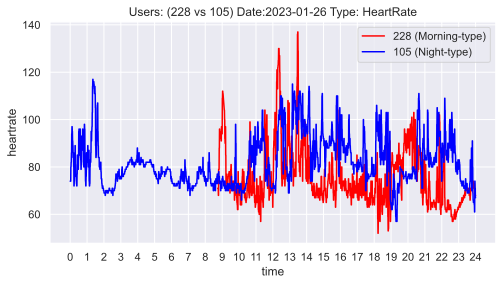

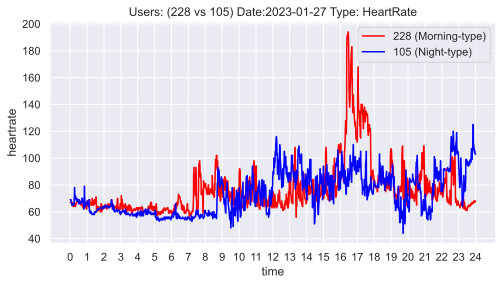

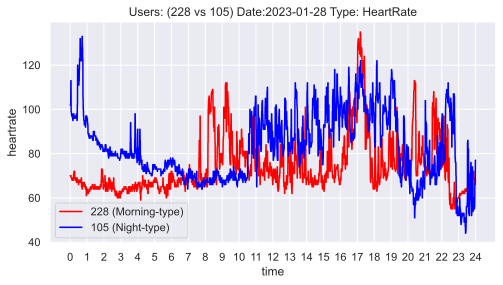

...

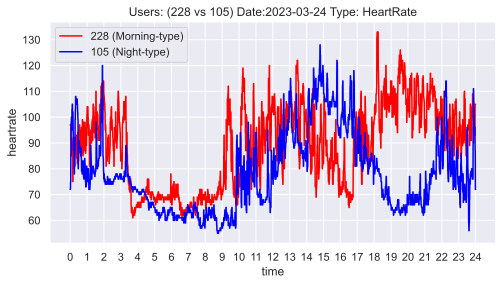

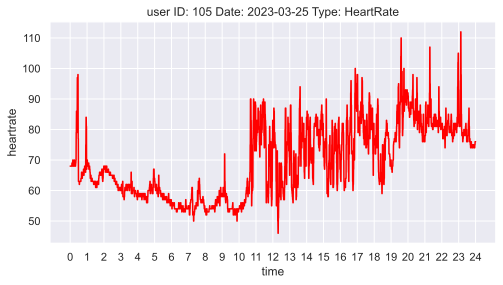

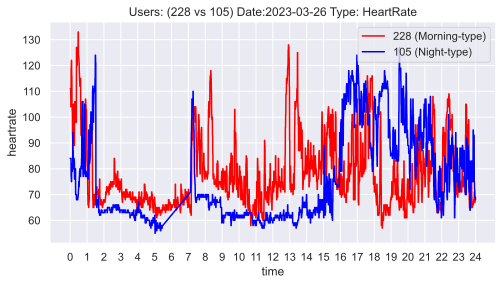

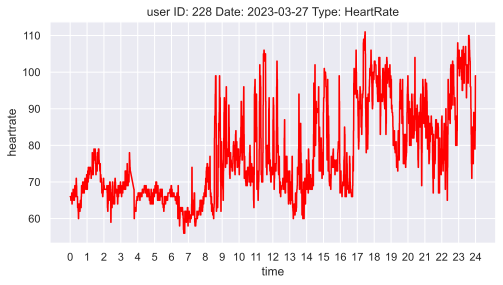

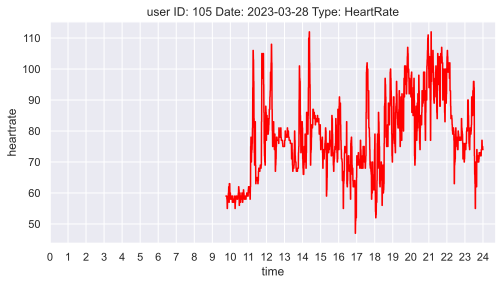

In [5]:
#setting dates
start_date = datetime(2023, 1, 1)
end_date = datetime(2023, 5, 1)

#calling function to start printing
print_compare_graphs_in_dates(start_date, end_date)